# Ambiente de Desenvolvimento

In [ ]:
## Instalação de Bibliotecas
!pip install opencv-contrib-python

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
# Inicialização de bibliotecas
import tensorflow as tf

import numpy as np
import matplotlib.pylab as plt
import pandas as pd
import cv2
import os
  
from skimage import io
from PIL import Image

from google.colab.patches import cv2_imshow

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  1


In [ ]:
## Acessar arquivos do drive
from google.colab import drive
drive.mount('/content/drive')
os.chdir('/content/drive/MyDrive/Aulas Intro VC/data/')
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
10_frame_binary.jpg	enforcando.jpeg
11_frame_face.jpg	frame_arena.jpg
12_frame_coin.jpg	frame_build.jpg
12_frame_mario.jpg	frame_colors.jpg
13_frame_messi.jpg	frame_escadaria.jpg
13_frame_target.jpg	frame_exerc2.jpg
14_frame_orla.jpg	frame_eye.jpg
15_frame_mars.jpg	frame_mars.jpg
16_frame_paisagem.jpg	frame_oscar.jpg
1_frame_desafio.jpg	frame_poa.jpg
2_frame_274.jpg		frame_tomo.jpg
3_frame_copa.jpg	haarcascade_frontalface_default.xml
4_frame_mamo.jpg	images.jfif
5_frame_cores.jpg	mae.png
6_frame_coldplay.jpg	me.png
7_frame_containers.jpg	mse.png
8_frame_hist.jpg	template_homem.jpg
9_frame_drone.jpg	template_mulher.jpg
download.png


In [ ]:
## Caminho que se encontram as imagens
path_images = '/content/drive/MyDrive/Aulas Intro VC/data/'

# Funções Básicas OpenCV

In [ ]:
# Leitura de imagem
## Parametro = caminho do arquivo + nome do arquivo
cv2.HoughCircles('3_frame_copa.jpg')
# import the necessary packages
import numpy as np
import argparse
import cv2
# construct the argument parser and parse the arguments
ap = argparse.ArgumentParser()
ap.add_argument("-i", "--image", required = True, help = "Path to the image")
args = vars(ap.parse_args())

# load the image, clone it for output, and then convert it to grayscale
image = cv2.imread(args["image"])
output = image.copy()
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
img = cv2.imread(path_images + '2_frame_274.jpg')

# detect circles in the image
circles = cv2.HoughCircles(gray, cv2.HOUGH_GRADIENT, 1.2, 100)
# ensure at least some circles were found
if circles is not None:
	# convert the (x, y) coordinates and radius of the circles to integers
	circles = np.round(circles[0, :]).astype("int")
	# loop over the (x, y) coordinates and radius of the circles
	for (x, y, r) in circles:
		# draw the circle in the output image, then draw a rectangle
		# corresponding to the center of the circle
		cv2.circle(output, (x, y), r, (0, 255, 0), 4)
		cv2.rectangle(output, (x - 5, y - 5), (x + 5, y + 5), (0, 128, 255), -1)
	# show the output image
	cv2.imshow("output", np.hstack([image, output]))
	cv2.waitKey(0)



error: ignored

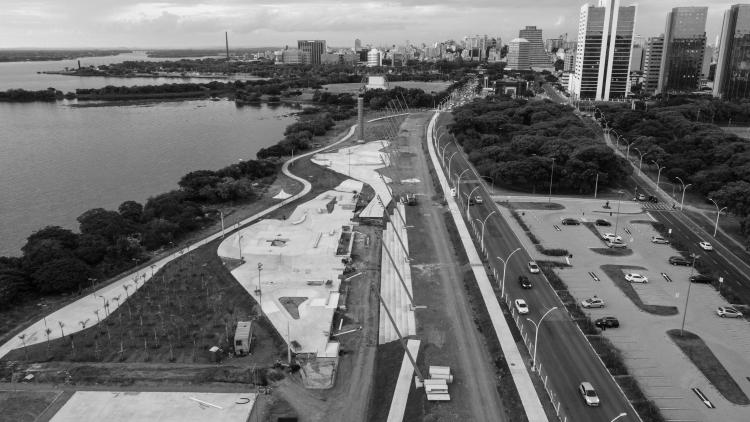

In [ ]:
## Tranformando em escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

cv2_imshow(gray)

# Manipulações de Imagens

Imagens P&B

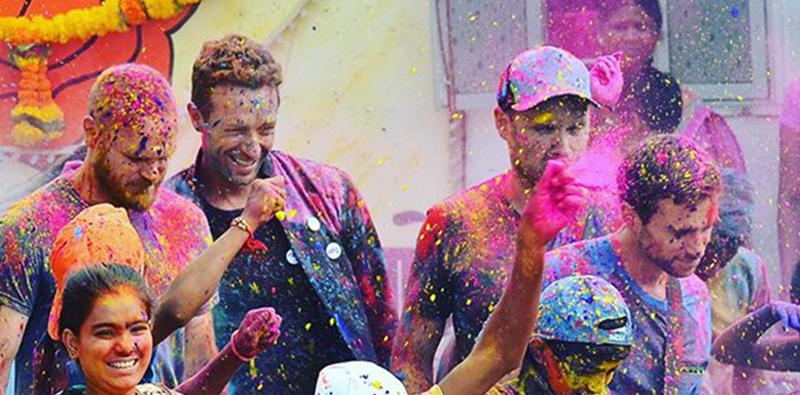

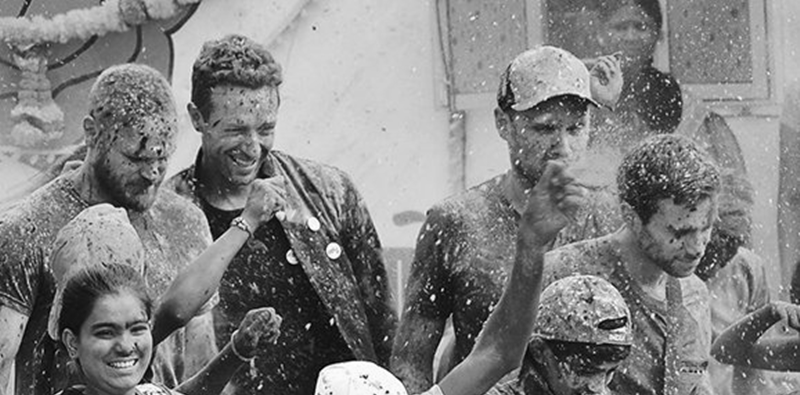

In [ ]:
image = cv2.imread(path_images + '6_frame_coldplay.jpg')

# RGB ↔ GRAY
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

cv2_imshow(image)
cv2_imshow(gray)

Quantização

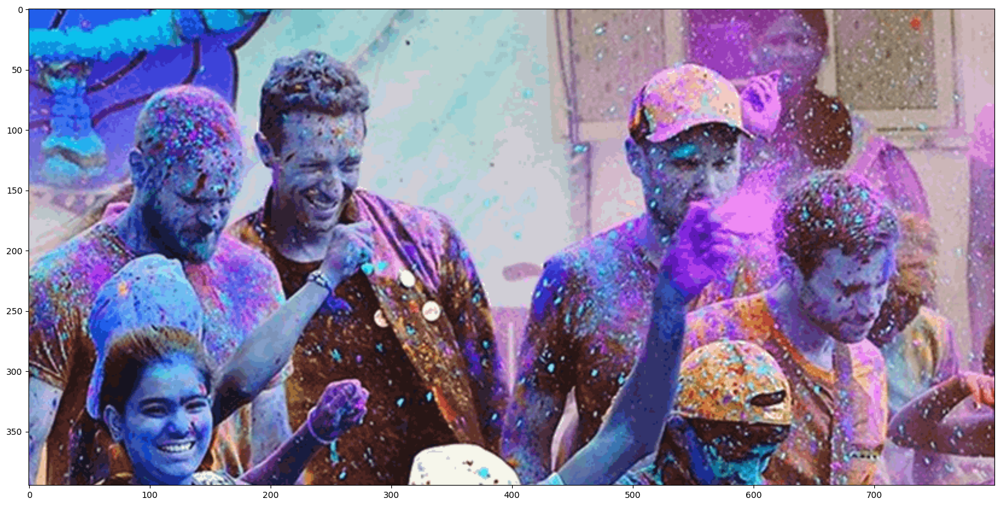

In [ ]:
def quantimage(image,k):

    i = np.float32(image).reshape(-1,3)
    condition = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,20,1.0)
    ret,label,center = cv2.kmeans(i, k , None, condition,10,cv2.KMEANS_RANDOM_CENTERS)
    center = np.uint8(center)
    final_img = center[label.flatten()]
    final_img = final_img.reshape(image.shape)

    return final_img

image = cv2.imread('6_frame_coldplay.jpg')

plt.figure(figsize = (50,10))
plt.imshow(quantimage(image,200))

Ruídos de Imagens - Imagem da Copa de Mundo do Brasil 1950 \\
Denoising - https://docs.opencv.org/3.4/d5/d69/tutorial_py_non_local_means.html 

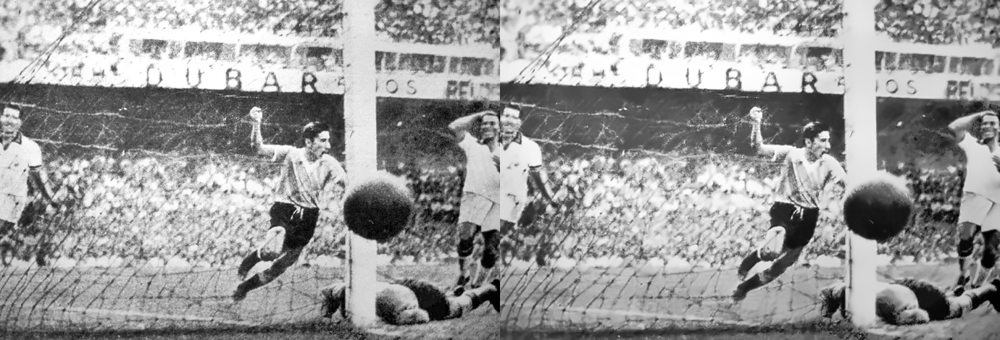

In [ ]:
img = cv2.imread(path_images + '3_frame_copa.jpg')

dst = cv2.fastNlMeansDenoising(img, None, 10, 7, 21)

# Parametros na sequência
# src - caminho da imagem
# dst - imagem de saida
# h - parametro que regula filtro, um valor de h grande remove boa parte do ruido, bem como remove detalhes da imagem original
# templateWindowSize - Tamanho em pixels do patch, para calculo de pesos do modelo, recomendado usar 7
# searchWindowSize - Tamanho em pixels da janela que é usado para calcular a média ponderada para determinado pixel, recomendado usar 21

# cv.fastNlMeansDenoising() - para imagens em escala de cinza
# cv.fastNlMeansDenoisingColored() - para imagens coloridas
# cv.fastNlMeansDenoisingMulti() - para imagens capturadas em curto período de tempo (escala de cinza)
# cv.fastNlMeansDenoisingColoredMulti() - para imagens capturadas em curto período de tempo (coloridas)

vis = np.concatenate((img, dst), axis=1)

cv2_imshow(vis)

# Modelos de Cores

Principais modelos de conversão - https://docs.opencv.org/3.4/de/d25/imgproc_color_conversions.html

Modelo RGB

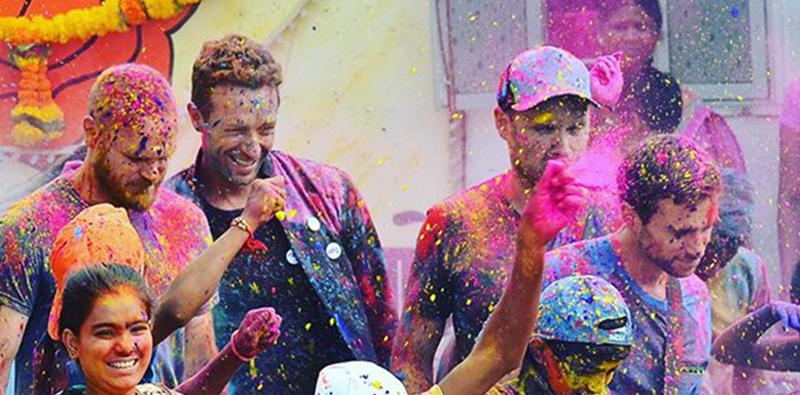

In [ ]:
image = cv2.imread(path_images + '6_frame_coldplay.jpg')

cv2_imshow(image)

Modelo CIE L*a*b*

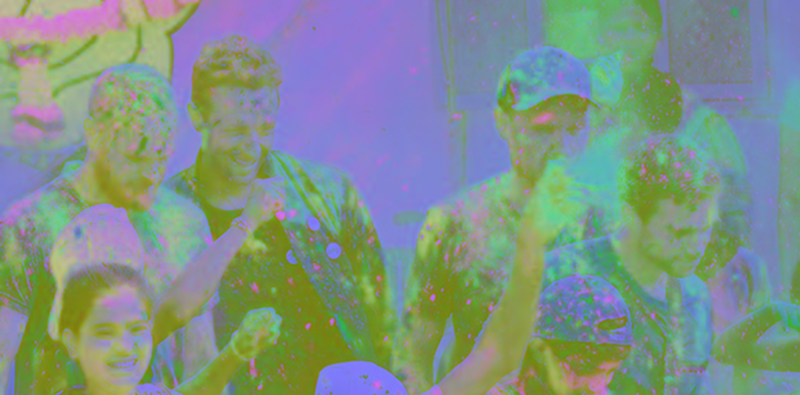

In [ ]:
image = cv2.imread(path_images + '6_frame_coldplay.jpg')

# RGB ↔ CIE L*a*b* 
ciel = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

cv2_imshow(ciel)

Modelo HSV

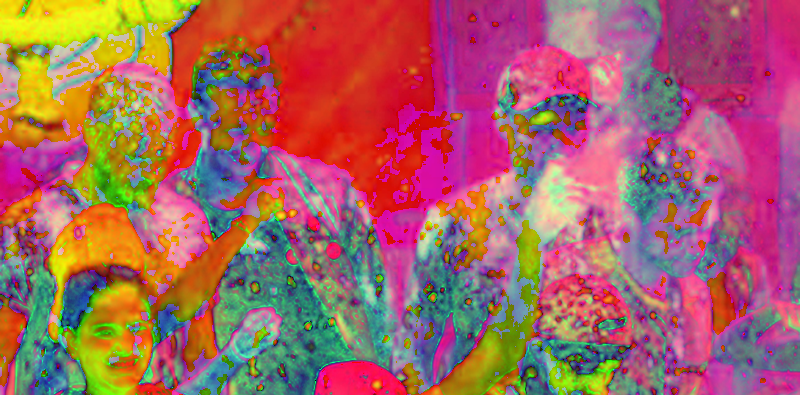

In [ ]:
image = cv2.imread(path_images + '6_frame_coldplay.jpg')

# RGB ↔ HSV 
hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

cv2_imshow(hsv)

# Realce

## Binarização de Imagens

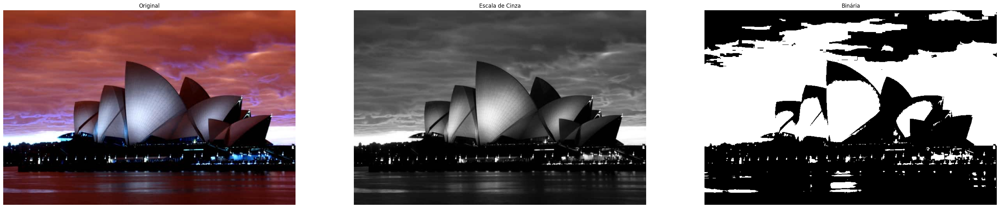

In [ ]:
img = cv2.imread(path_images + '10_frame_binary.jpg')

# Transforma para escala de cinza
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Metodo Binary 
# Cada valor de pixel acima de 70 será aumentado para 255, enquanto cada valor de pixel abaixo de 70 será reduzido para 0, criando uma imagem em preto e branco, com uma "máscara", cobrindo os objetos em primeiro plano.
ret, thresh = cv2.threshold(gray, 70, 255, cv2.THRESH_BINARY)

plt.figure(figsize=(40,24))
plt.subplot(131),plt.imshow(img,cmap = 'gray'),plt.title('Original'), plt.axis('off')
plt.subplot(132),plt.imshow(gray,cmap = 'gray'),plt.title('Escala de Cinza'),plt.axis('off')
plt.subplot(133),plt.imshow(thresh,cmap = 'gray'),plt.title('Binária'),plt.axis('off')

plt.show()

## Histograma Escala de Cinza

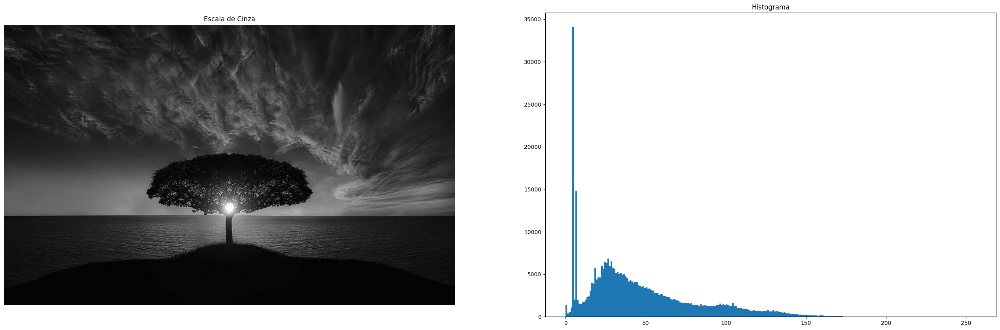

In [ ]:
imgHist = cv2.imread(path_images + '8_frame_hist.jpg', cv2.IMREAD_GRAYSCALE)
imgColor = cv2.imread(path_images + '8_frame_hist.jpg')

plt.figure(figsize=(50,10))

## Imagem Escala de cinza
plt.subplot(132),plt.imshow(imgHist,cmap = 'gray'),plt.title('Escala de Cinza'), plt.axis('off')

# Parametro plt.hist()
# imagem 
# contagem BIN, escala completa [256]
# intervalo, padrão [0, 256]
plt.subplot(133),plt.hist(imgHist.ravel(),256,[0,256]),plt.title('Histograma')

plt.show()

## Histograma RGB

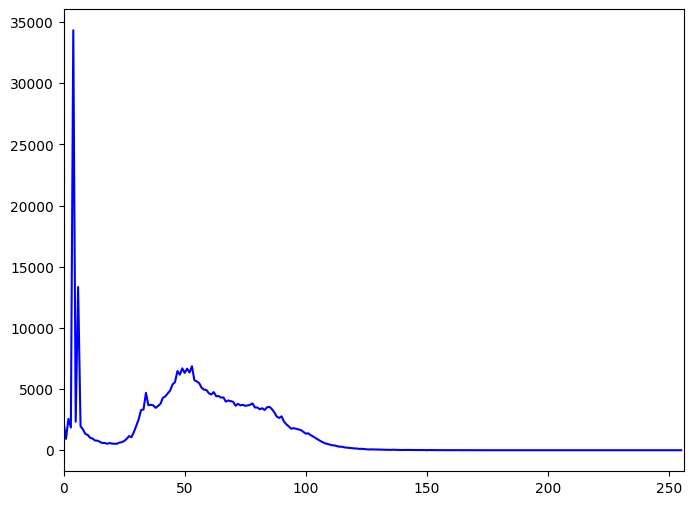

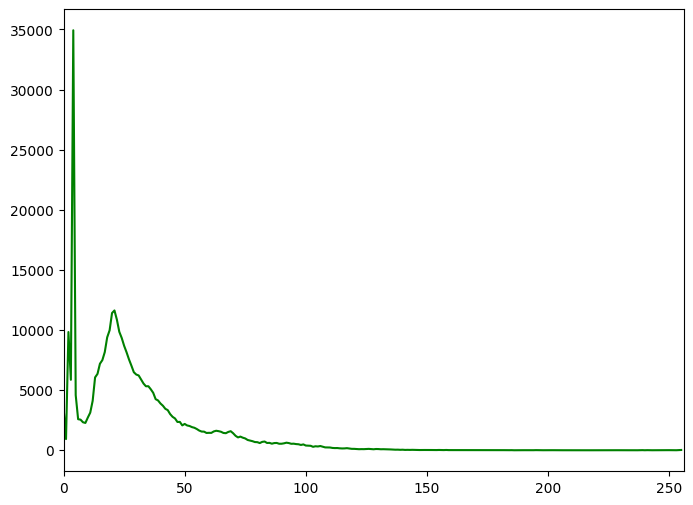

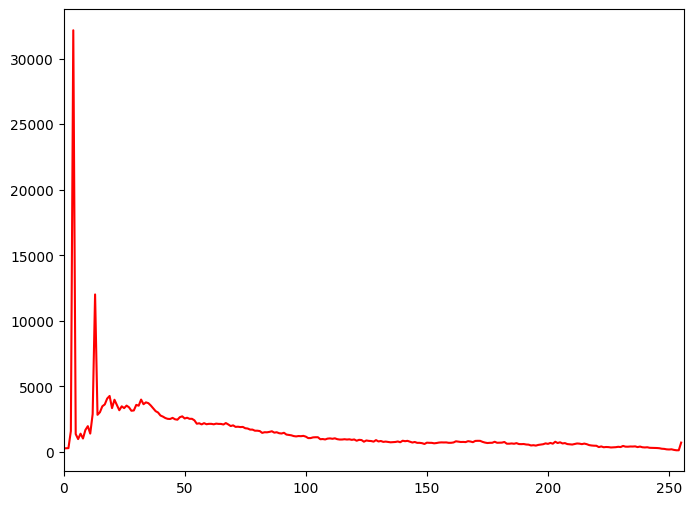

In [ ]:
img = cv2.imread(path_images + '8_frame_hist.jpg')

color = ('b','g','r')
for i, col in enumerate(color):
    
    ## Parametros
    # imagem (ente parenteses)
    # índice do canal para o qual calculamos o histogram, [0] para escala de cinza, e [0], [1] ou [2] para calcular o histograma do canal azul, verde ou vermelho   
    # mascara, caso seja necessario considerar uma região especifica
    # contagem BIN, escala completa [256]
    # intervalo, padrão [0, 256]
    histr = cv2.calcHist([img],[i],None,[256],[0,256])
    plt.figure(figsize=(8,6))

    plt.plot(histr,color = col)
    plt.xlim([0,256])

plt.show()

## Equalização de Histograma - https://docs.opencv.org/3.4/d4/d1b/tutorial_histogram_equalization.html

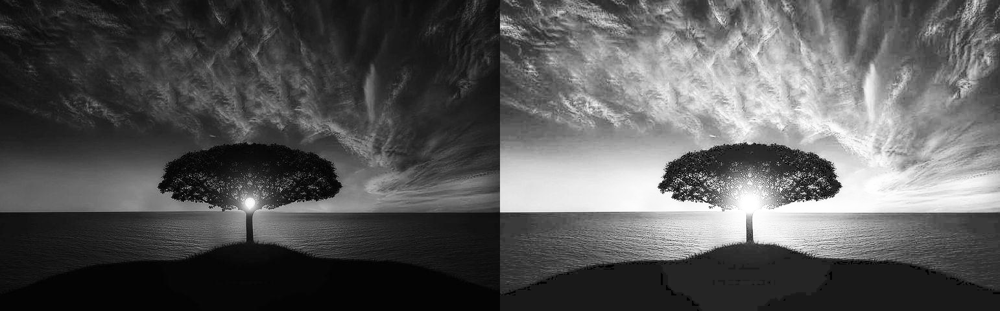

In [ ]:
img_bgr = cv2.imread(path_images + '8_frame_hist.jpg')

## Converte de RBG para Escala de Cinza
src = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)

## Imagem na escala de cinza
dst = cv2.equalizeHist(src)

vis = np.concatenate((src, dst), axis=1)

cv2_imshow(vis)

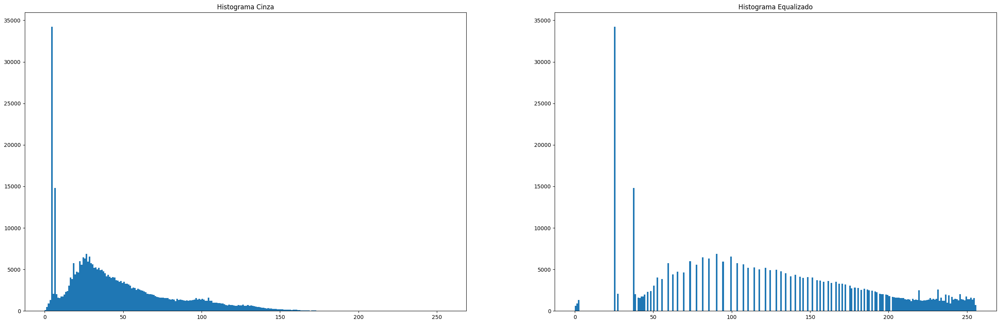

In [ ]:
plt.figure(figsize=(50,10))

plt.subplot(131),plt.hist(src.ravel(),256,[0,256]),plt.title('Histograma Cinza')
plt.subplot(132),plt.hist(dst.ravel(),256,[0,256]),plt.title('Histograma Equalizado')

plt.show()

## Transformação Linear - https://docs.opencv.org/4.x/d3/dc1/tutorial_basic_linear_transform.html

Brilho e Constraste


In [ ]:
# Redimensionamento de imagens
image = cv2.imread(path_images + '9_frame_drone.jpg')

# Percentual de escala desejada
scale_percent = 50 

width = int(image.shape[1] * scale_percent / 100)
height = int(image.shape[0] * scale_percent / 100)

## Dimensão Final
dim = (width, height)  

image_size = cv2.resize(image, dim, interpolation = cv2.INTER_AREA)

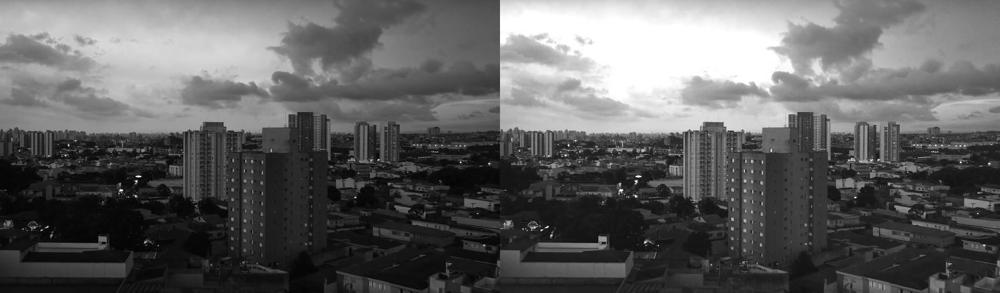

In [ ]:
# Controle de Contraste (1.0 a 3.0)
alpha = 1.3
# Controle de Brilho (0 a 100)
beta = 12 

imageg = cv2.cvtColor(image_size, cv2.COLOR_BGR2GRAY)

# inicialização de uma nova imagem com valores de pixels zerados
new_image = np.zeros(imageg.shape, imageg.dtype)

# Percore os canais Escala de cinza, e aplicar a formula g = af + b
# for y in range(image.shape[0]):
#     for x in range(image.shape[1]):
#             new_image[y,x] = np.clip(alpha*image[y,x] + beta, 0, 255)

# Parametros: imagem, valores de alpha e valor de beta
new_image = cv2.convertScaleAbs(imageg, alpha=alpha, beta=beta)

vis = np.concatenate((imageg, new_image), axis=1)

cv2_imshow(vis)

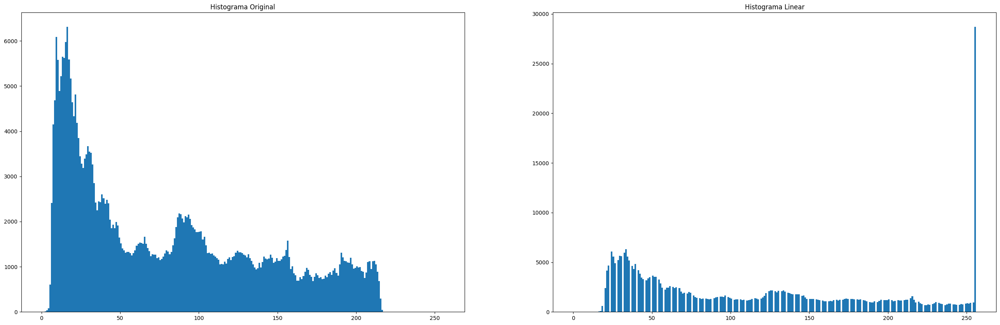

In [ ]:
plt.figure(figsize=(50,10))

plt.subplot(131),plt.hist(imageg.ravel(),256,[0,256]),plt.title('Histograma Original')
plt.subplot(132),plt.hist(new_image.ravel(),256,[0,256]),plt.title('Histograma Linear')

plt.show()

## Transformação Não Linear

Correção de Gamma 

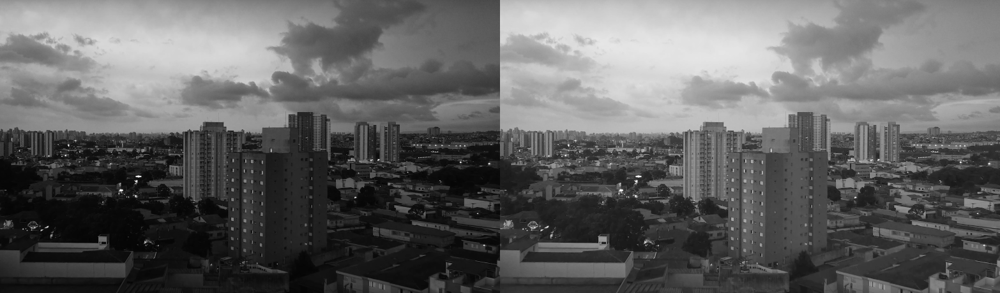

In [ ]:

imageg = cv2.cvtColor(image_size, cv2.COLOR_BGR2GRAY)

# inicialização de uma nova imagem com valores de pixels zerados
new_image = np.zeros(imageg.shape, imageg.dtype)

# Parametro gamma [0.0 a 1.0]
gamma = 0.6

lookUpTable = np.empty((1,256), np.uint8)
for i in range(256):
    lookUpTable[0,i] = np.clip(pow(i / 255.0, gamma) * 255.0, 0, 255)
res = cv2.LUT(imageg, lookUpTable)

vis = np.concatenate((imageg, res), axis=1)

cv2_imshow(vis)

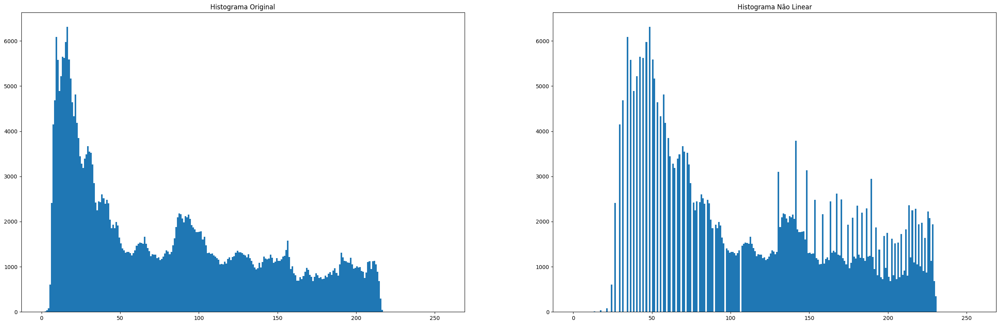

In [ ]:
plt.figure(figsize=(50,10))

plt.subplot(131),plt.hist(imageg.ravel(),256,[0,256]),plt.title('Histograma Original')
plt.subplot(132),plt.hist(res.ravel(),256,[0,256]),plt.title('Histograma Não Linear')

plt.show()

# Filtros

## Template Matching - https://docs.opencv.org/4.x/d4/dc6/tutorial_py_template_matching.html

(Text(0.5, 1.0, 'Detected Point'), ([], []), ([], []))

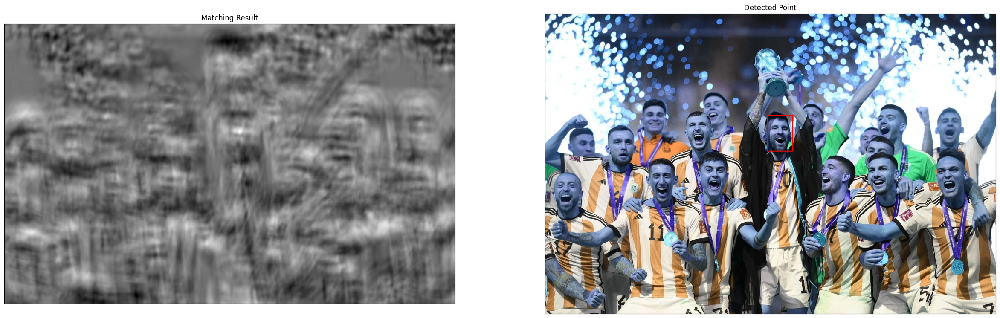

In [ ]:
## Frame Principal
img_rgb = cv2.imread(path_images + '13_frame_messi.jpg')
img_gray = cv2.cvtColor(img_rgb, cv2.COLOR_BGR2GRAY)

## Frame a ser detectado
template = cv2.imread(path_images + '13_frame_target.jpg', cv2.IMREAD_GRAYSCALE)

w, h = template.shape[::-1]

img = img_rgb.copy()
method = eval('cv2.TM_CCOEFF')

## Modelos
# TM_CCORR = Correlação Cruzada
# TM_SQDIFF = Soma das diferenças quadradas
# TM_CCOEFF = Correlação de Pearson
# TM_SQDIFF_NORMED, TM_CCORR_NORMED, TM_CCOEFF_NORMED = Modelos Normalizados, para comparação

# Parametros: frame a ser detectado, frame principal e método
res = cv2.matchTemplate(template,img_gray,method)
# Retorna valores de coordenadas
min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(res)

if method in [cv2.TM_SQDIFF, cv2.TM_SQDIFF_NORMED]:
    top_left = min_loc
else: 
    top_left = max_loc

bottom_right = (top_left[0] + w, top_left[1] + h)
# Baseada nas coordenadas de retorno, o objeto detectado é desenhado
cv2.rectangle(img, top_left, bottom_right, 255, 2)

plt.figure(figsize=(30,18))
plt.subplot(121),plt.imshow(res,cmap = 'gray')
plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(img,cmap = 'gray')
plt.title('Detected Point'), plt.xticks([]), plt.yticks([])


## Blur (Averaging) - https://docs.opencv.org/4.x/d4/d13/tutorial_py_filtering.html

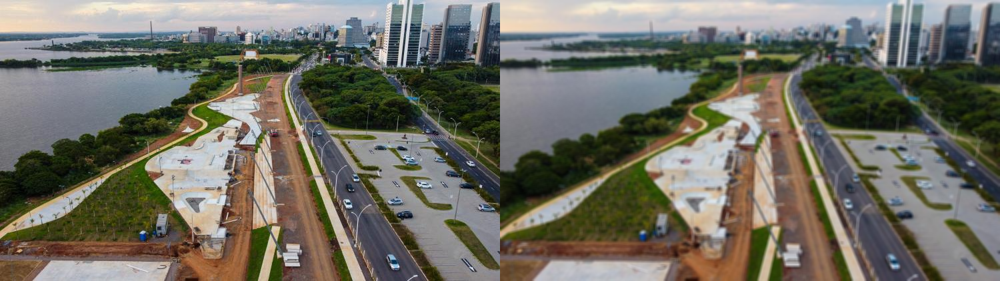

In [ ]:
img = cv2.imread(path_images + '14_frame_orla.jpg')

# Parametros: imagem e tamanho do kernel (5x5) 
blur = cv2.blur(img, (5,5))

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

## Blur Gaussiano

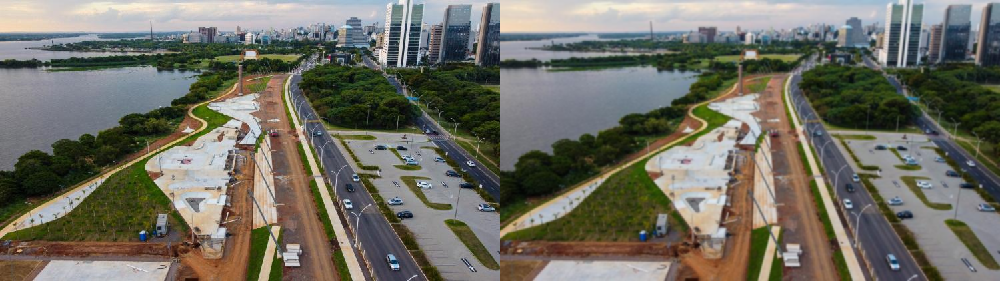

In [ ]:
img = cv2.imread(path_images + '14_frame_orla.jpg')

# Parametros: imagem, tamanho do kernel (5x5) e o desvio padrão do kernel Gaussiano na direção X.
blur = cv2.GaussianBlur(img,(5,5), 0)

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

## Median Blur 

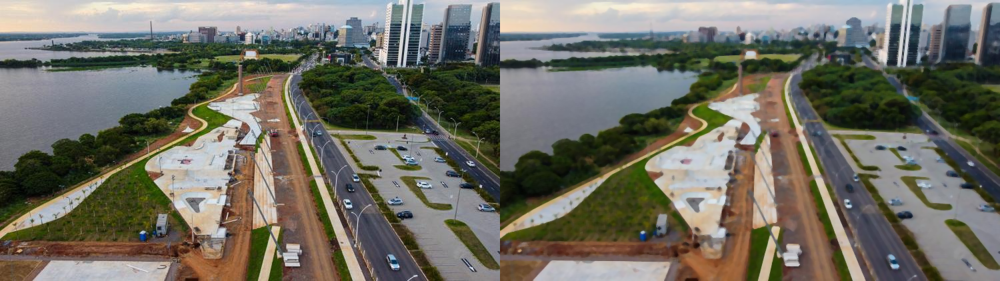

In [ ]:
img = cv2.imread(path_images + '14_frame_orla.jpg')

# Parametros: imagem e mediana de todos os pixels na área do kernel
blur = cv2.medianBlur(img, 5)

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

## Bilaterial Filtering

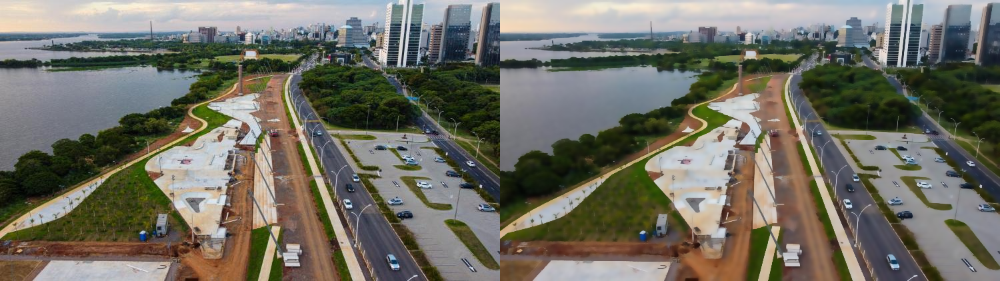

In [ ]:
img = cv2.imread(path_images + '14_frame_orla.jpg')

# Parametros: 
# imagem
# diâmetro da vizinhança de cada pixel
# sigmaColor: quanto maior o valor, as cores mais distantes umas das outras vão começar a se misturar.
# sigmaSpace: auanto maior o seu valor, mais pixels irão se misturar, dado que suas cores estão dentro do intervalo.
blur = cv2.bilateralFilter(img, 9, 75, 75)

vis = np.concatenate((img, blur), axis=1)

cv2_imshow(vis)

## Filtro Passa Baixa

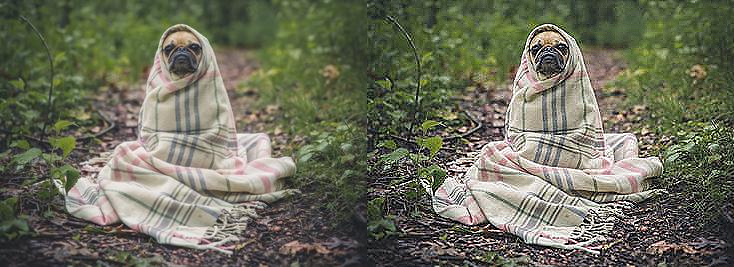

In [ ]:
img_src = cv2.imread(path_images + '16_frame_paisagem.jpg')

# tamanho do kernel (3x3) (matriz impar)
kernel = np.array([[0, -1,  0],
                   [-1,  5, -1],
                    [0, -1,  0]])

# Parametros 
# src = imagem
# ddepth = É a profundidade desejável da imagem de destino. O valor -1 representa que a imagem resultante terá a mesma profundidade da imagem de origem.
# kernel = matrix de kernel
img_rst = cv2.filter2D(img_src, ddepth=-1, kernel=kernel)

vis = np.concatenate((img_src, img_rst), axis=1)

cv2_imshow(vis)

## Filtro Passa Alta

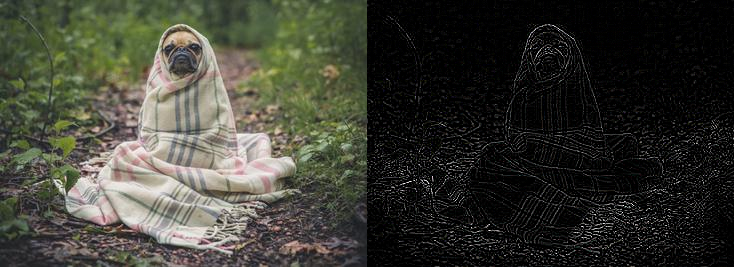

In [ ]:
img_src = cv2.imread(path_images + '16_frame_paisagem.jpg')

# tamanho do kernel (3x3) (matriz impar)
kernel = np.array([[0.0, -1.0, 0.0], 
                   [-1.0, 4.0, -1.0],
                   [0.0, -1.0, 0.0]])

# Parametros 
# src = imagem
# ddepth = É a profundidade desejável da imagem de destino. O valor -1 representa que a imagem resultante terá a mesma profundidade da imagem de origem.
# kernel = matrix de kernel
img_rst = cv2.filter2D(img_src, ddepth=-1, kernel=kernel)

vis = np.concatenate((img_src, img_rst), axis=1)

cv2_imshow(vis)

# Exercícios

*   Reproduzir os niveis de escalas de cinza da uma imagem da sua escolha, e representar lado a lado para uma melhor visualização.
*   Eliminar ruídos na Imagem de Mamografia [4_frame_mamo.jpg] (dataset Kaggle - https://www.kaggle.com/datasets/fraolgelana/mamographysmalldataset)
*   Conversão de uma Imagem RBG ↔ HSV 
*   Conversão de uma Imagem RGB ↔ YCrCb
*   Criar função para cálculo de Distancia Euclidiana (sem uso de bibliotecas), e ligar os depois pontos em uma imagem da sua escolha.

In [ ]:
## Exercício 1

In [ ]:
## Exercício 2

In [ ]:
## Exercício 3

In [ ]:
## Exercício 4

In [ ]:
## Exercício 5

# Desafio 1

Dado a imagem abaixo, realize a localização das faces (regiões dos olhos, nariz e boca) apenas dos espectadores. Realizar a exclusão do frame do video, já que o mesmo também possui face que não corresponde ao foco da tarefa (zona de interesse). Desenhar um retangulo na localização das Faces.

Sugestões:
- utilização de coordenadas eixo x e y
- cálculo de distâncias (euclidiana) 
- funções de template matching (OpenCV)
- funções cv2.blur() para alteração de zona que nao corresponde ao interesse


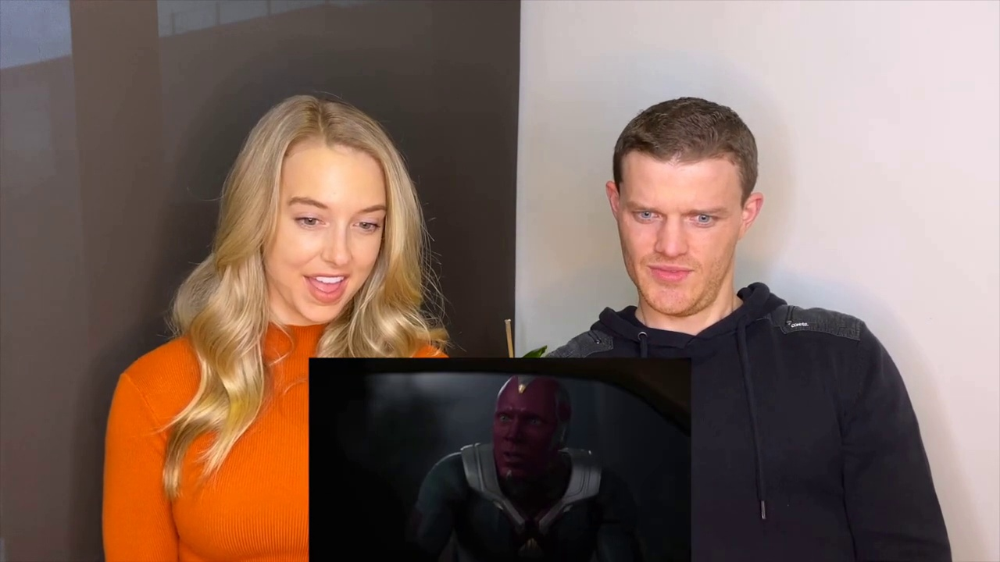

In [ ]:
## Imagem do Desafio
img = cv2.imread(path_images + '1_frame_desafio.jpg')
cv2_imshow(img)

# Desafio 2

Dado a imagem abaixo, implementa um detector de cores, que apresente a frequencia das principais cores encontradas.

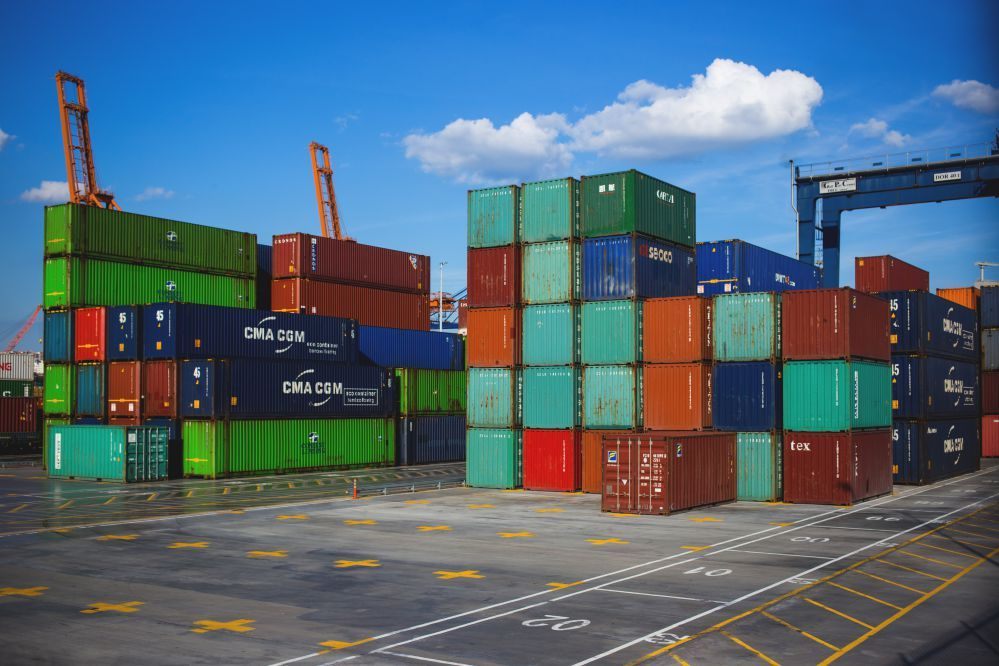

In [ ]:
## Imagem do Desafio
img = cv2.imread(path_images + '7_frame_containers.jpg')
cv2_imshow(img)